# Soc-88 Final Project

This notebook is the first step for your final project.  In this notebook, you will be introduced to your dataset and guided through some analysis and visualizations that you will use for your final policy brief.  You can use some or all of the figures provided below to formulate your argument, and you are encouraged to perform your own analysis and create your own figures.

# The Data

In [1]:
from datascience import *
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

Our dataset is the CalEnviroScreen 3.0 data, which contains data on a variety of different environmental markers in different census regions, or "tracts," as well as an overall pollution score, called the "CES 3.0 Score."  In our version of the data, it is denoted as __ces_30_score__.  It also contains some demographic information.  More information on the data can be found here: https://oehha.ca.gov/media/downloads/calenviroscreen/report/ces3report.pdf

In [2]:
clean_ces_data = Table.read_table("cleaned_epa_data.csv")
clean_ces_data.show(5)

census_tract,ces_30_score,ozone,pm25,diesel_pm,drinking_water,pesticides,tox_release,traffic,cleanup_sites,groundwater_threats,haz_waste,imp_water_bodies,solid_waste,pollution_burden_score,asthma,low_birth_weight,cardiovascular_disease,education,poverty,unemployment,housing_burden,hispanic,white,african_american,native_american,asian_american,other,pct_nonwhite
6019001100,94.0902,0.0648885,15.4,48.5238,681.196,2.7496,18552,909.14,80.5,45.75,0.795,0,21.75,9.84876,131.64,7.44,14.13,53.3,76.3,17.6,26,65.3,4.2,24.6,0.5,3.5,1.8,95.7
6071001600,90.6778,0.062163,13.31,38.5563,904.658,1.36536,7494.24,782.26,66.2,36,1.25,5,12,10,60.66,7.04,12.94,53.3,72.5,12.3,34.1,91.1,5.8,0.7,0.3,1.4,0.7,94.2
6019000200,85.97,0.062163,15.4,47.4452,681.196,3.02563,12454.9,576.52,22,30.25,0.2,0,2.5,8.76466,142.12,10.16,14.96,42.3,86.8,16.1,40.1,63.6,5.3,18.9,0.6,9.8,1.8,94.7
6077000801,82.4915,0.0461783,12.54,24.117,278.756,12.9263,2387.78,1305.01,50.1,132.1,0.795,19,27,9.17439,142.17,6.23,14.72,40.8,61.3,19.6,21.1,57.4,6,12.5,0.3,20.9,2.8,93.9
6019001500,82.0308,0.0648885,15.4,18.8459,1000.24,3518.41,21790.7,435.16,60,54.2,13.1,0,50.8,9.87808,90.48,4.5,12.82,45.1,66.4,18.6,28.1,71.8,21.4,1.2,0.5,4.5,0.6,78.6


In [3]:
clean_ces_data.labels

('census_tract',
 'ces_30_score',
 'ozone',
 'pm25',
 'diesel_pm',
 'drinking_water',
 'pesticides',
 'tox_release',
 'traffic',
 'cleanup_sites',
 'groundwater_threats',
 'haz_waste',
 'imp_water_bodies',
 'solid_waste',
 'pollution_burden_score',
 'asthma',
 'low_birth_weight',
 'cardiovascular_disease',
 'education',
 'poverty',
 'unemployment',
 'housing_burden',
 'hispanic',
 'white',
 'african_american',
 'native_american',
 'asian_american',
 'other',
 'pct_nonwhite')

As you can see, there are quite a few different categories to look at.  We will provide some figures below, and you can use those or use them as a starting point for your own analysis.

__Note__: We found that many of these data points do not show any correlation, so don't be concerned if you find the same.

# The Analysis

Question 1: how does pollution score affect asthma rates?

__The plot below has no labels and limited formatting.  It is your job to format the plot and to determine the axis labels and title.__

<Figure size 432x288 with 0 Axes>

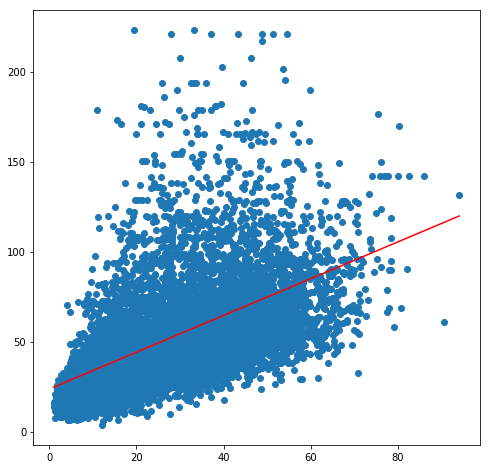

In [4]:
plt.clf()

fig = plt.figure(facecolor='white', figsize=(8,8))
ax = fig.add_subplot(111)

plt.scatter(clean_ces_data.column("ces_30_score"), clean_ces_data.column("asthma"))

#add trendline using np.polyfit: takes x, y, and degree of polynomial (1)
#recall y = m*x + b
m, b = np.polyfit(clean_ces_data.column("ces_30_score"), clean_ces_data.column("asthma"), 1)
plt.plot(clean_ces_data.column("ces_30_score"), m*clean_ces_data.column("ces_30_score") + b, color='red')

plt.show()

Let's explore the relationship between the percent of nonwhite residents in a census tract and its pollution score.

__Again, the plot below has no labels and limited formatting.  It is your job to format the plot and to determine the axis labels and title.__ Perhaps consider adding a trendline?

<Figure size 432x288 with 0 Axes>

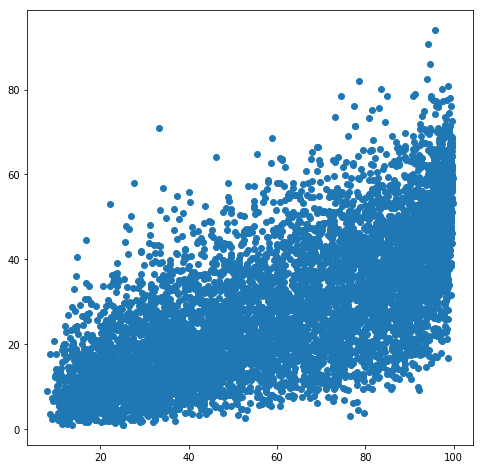

In [5]:
plt.clf()

fig = plt.figure(facecolor='white', figsize=(8,8))
ax = fig.add_subplot(111)

plt.scatter(clean_ces_data.column("pct_nonwhite"), clean_ces_data.column("ces_30_score"))

plt.show()

Let's now look at how poverty of a census tract and pollution score relate.

__Again, the plot below has no labels and limited formatting.  It is your job to format the plot and to determine the axis labels and title.__ Perhaps consider adding a trendline?

<Figure size 432x288 with 0 Axes>

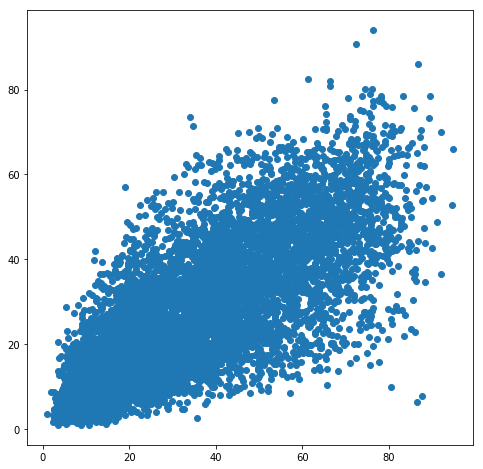

In [6]:
plt.clf()

fig = plt.figure(facecolor='white', figsize=(8,8))
ax = fig.add_subplot(111)

plt.scatter(clean_ces_data.column("poverty"), clean_ces_data.column("ces_30_score"))

plt.show()

Let's now look at mapping.  Due to the nature of this data, we have to do some slightly complicated things to get the mapping to work, but that work has been done for you.

In [7]:
#run this cell, do not change the contents
#load dependencies
import folium
import json
import os
import pandas as pd

In [8]:
#run this cell, do not change the contents
#load raw Cal EnviroScreen xlsx file, this will take a few seconds, format to match geojson
full_epa_data = pd.read_excel('ces3results.xlsx')
full_epa_data['Census Tract'] = full_epa_data['Census Tract'].apply(str)

In [9]:
#run this cell, do not change the contents
#load clean geojson
mapping = json.load(open('formatted_ca_tracts.geojson'))

The map below is a __template__ for you to use to create your own maps.  __The formatting is up to you.__

In [10]:
#this code will take a few seconds to run
center = [37.16611, -119.44944]

m = folium.Map(center, zoom_start=6)

folium.Choropleth(
    geo_data=mapping,
    data=full_epa_data,
    columns=['Census Tract', 'CES 3.0 Score'],
    key_on='feature.properties.GEOID',
    fill_color='RdPu',
    legend_name='CES 3.0 Pollution Score'
).add_to(m)

folium.LayerControl().add_to(m)

m

# Next Steps

After formatting these plots, your task is to use these visualizations or others of your own creation in developing a policy brief, impact plan, and explainer video.  Good luck!

_Developed by Katherine Oosterbaan, Keilyn Yuzuki, and Keeley Takimoto_